In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import lightgbm as lgb

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import f1_score, confusion_matrix, accuracy_score, roc_auc_score, roc_curve
from sklearn.neighbors import KernelDensity

In [3]:
def wape_metrics(y_true, y_pred): 
    return (sum(np.abs(y_true - y_pred))/sum(np.abs(y_true)))*100

In [4]:
def smape(x, y):
    if (x == 0) & (y == 0):
        return 0
    else:
        return np.abs(x - y) / (np.abs(x) + np.abs(y))

In [5]:
vecsmape = np.vectorize(smape)

In [6]:
def smape_metrics(y_true, y_pred):
    return np.mean(vecsmape(y_true, y_pred)) * 100

In [7]:
data = pd.read_parquet('/main/data/MVideo_2/dataset_main_5_0.parquet')

In [8]:
data.head()

,DATE,INTERNET,MAINCATEGORY_ID,MONTH(DATE),PRODUCT_ID,PROMOTIONS_AVAILABLE_ABS_DIFF_MEAN_8,PROMOTIONS_AVAILABLE_DIFF_P1,PROMOTIONS_AVAILABLE_P1,PROMOTIONS_AVAILABLE_W0,PROMOTIONS_AVAILABLE_W1,...,sales.SUM(trans.UNITS_SOLD)_W5,sales.SUM(trans.UNITS_SOLD)_W6,sales.SUM(trans.UNITS_SOLD)_W7,sales.SUM(trans.UNITS_SOLD)_W8,store.MAX(trans.REVENUE_INCL_TAX)_W8,store.MAX(trans.UNITS_SOLD)_MEAN_8,store.SUM(trans.REVENUE_INCL_TAX)_W5,store.SUM(trans.UNITS_SOLD)_MEAN_DECAY_4,store.SUM(trans.UNITS_SOLD_P)_MEDIAN_4,store.SUM(trans.UNITS_SOLD_P)_MIN_2
index,,,,,,,,,,,,,,,,,,,,,
3,2016-09-04,0,107,9,10007755,0.0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.500,0.0,51.749088,33.5,39.0
4,2016-09-11,0,107,9,10007755,0.0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.625,0.0,49.791344,33.5,27.0
5,2016-09-18,0,107,9,10007755,0.0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.750,1751447.0,51.256119,33.0,27.0
6,2016-09-25,0,107,9,10007755,0.0,0,0,0,0,...,1.0,0.0,0.0,0.0,0.0,0.875,1288187.0,59.578346,31.5,27.0
7,2016-10-02,0,107,10,10007755,0.0,0,0,0,0,...,0.0,1.0,0.0,0.0,0.0,1.000,1440009.0,60.070122,31.0,35.0


In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2831698 entries, 3 to 2935728
Columns: 115 entries, DATE to store.SUM(trans.UNITS_SOLD_P)_MIN_2
dtypes: datetime64[ns](1), float32(93), int32(21)
memory usage: 1.2 GB


In [10]:
data[['PRODUCT_ID', 'MAINCATEGORY_ID', 'SUBCATEGORY_ID',
       'STORE_ID', 'REGION', 'INTERNET',
       'WEEK(DATE)', 'MONTH(DATE)']] = data[['PRODUCT_ID', 'MAINCATEGORY_ID', 'SUBCATEGORY_ID',
                                                          'STORE_ID', 'REGION', 'INTERNET',
                                                          'WEEK(DATE)', 'MONTH(DATE)']].astype('category')

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2831698 entries, 3 to 2935728
Columns: 115 entries, DATE to store.SUM(trans.UNITS_SOLD_P)_MIN_2
dtypes: category(8), datetime64[ns](1), float32(93), int32(13)
memory usage: 1.2 GB


In [12]:
np.sum(data.UNITS_SOLD_P1 == 0) / len(data.UNITS_SOLD_P1)

0.7450335452438784

In [13]:
np.sum(data.UNITS_SOLD_P1 == 1) / len(data.UNITS_SOLD_P1)

0.1789809506522235

In [14]:
np.sum(data.UNITS_SOLD_P1 == 2) / len(data.UNITS_SOLD_P1)

0.04548578273530581

In [15]:
np.sum(data.UNITS_SOLD_P1 == 3) / len(data.UNITS_SOLD_P1)

0.016190638973506356

In [16]:
np.sum(data.UNITS_SOLD_P1 <= 3) / len(data.UNITS_SOLD_P1)

0.9856909176049141

In [17]:
data.DATE.max()

Timestamp('2018-07-01 00:00:00')

In [18]:
data_train = data[data.DATE < '2018-01-01']

In [19]:
data_train.shape[0]

2054440

In [20]:
data_val = data[(data.DATE >= '2018-03-18') & (data.DATE < '2018-05-13')]

In [21]:
data_val.shape[0]

226359

In [22]:
data_test = data[data.DATE >= '2018-05-13']

In [23]:
data_test.shape[0]

228237

In [24]:
feat = [s for s in data.columns if s not in ['DATE', 'UNITS_SOLD_P1']]

In [26]:
dts = lgb.Dataset(data_train[feat], label = data_train.UNITS_SOLD_P1)

In [27]:
dts.construct()

In [28]:
dtsv = dts.create_valid(data_val[feat], label = data_val.UNITS_SOLD_P1)

In [30]:
params = {
    'application': 'regression_l2',
    'learning_rate': 0.03,
    'num_leaves': 511,
    'metric': 'l2_root'
    #'tree_learner' : 'data',
    #'min_data_in_leaf' : 430,
    #'min_sum_hessian_in_leaf' : 0.1,
    #'feature_fraction' : 0.9,
    #'bagging_fraction' : 0.875,
    #'bagging_freq' : 3,
    #'lambda_l2' : 0.4581
    }

In [30]:
bst = lgb.train(params, dts, valid_sets = [dtsv], valid_names = ['Validation'],
                num_boost_round = 10000, early_stopping_rounds = 20)

[1]	Validation's rmse: 0.887831
Training until validation scores don't improve for 20 rounds.
[2]	Validation's rmse: 0.882867
[3]	Validation's rmse: 0.878319
[4]	Validation's rmse: 0.873684
[5]	Validation's rmse: 0.869561
[6]	Validation's rmse: 0.865495
[7]	Validation's rmse: 0.861636
[8]	Validation's rmse: 0.85789
[9]	Validation's rmse: 0.854648
[10]	Validation's rmse: 0.851452
[11]	Validation's rmse: 0.84843
[12]	Validation's rmse: 0.845582
[13]	Validation's rmse: 0.842853
[14]	Validation's rmse: 0.840218
[15]	Validation's rmse: 0.837693
[16]	Validation's rmse: 0.835096
[17]	Validation's rmse: 0.832765
[18]	Validation's rmse: 0.830772
[19]	Validation's rmse: 0.828873
[20]	Validation's rmse: 0.827004
[21]	Validation's rmse: 0.825206
[22]	Validation's rmse: 0.823454
[23]	Validation's rmse: 0.821859
[24]	Validation's rmse: 0.820457
[25]	Validation's rmse: 0.819147
[26]	Validation's rmse: 0.817905
[27]	Validation's rmse: 0.816619
[28]	Validation's rmse: 0.815485
[29]	Validation's rmse: 0

In [31]:
pred = bst.predict(data_test[feat])

In [32]:
np.sqrt(mean_squared_error(data_test.UNITS_SOLD_P1, pred))

0.8525841430078689

In [33]:
mean_absolute_error(data_test.UNITS_SOLD_P1, pred)

0.4737453528639645

In [34]:
res = data_test[['DATE', 'PRODUCT_ID', 'STORE_ID', 'UNITS_SOLD_P1']].copy()

In [35]:
res['PRED_P1'] = pred

In [36]:
res.head()

,DATE,PRODUCT_ID,STORE_ID,UNITS_SOLD_P1,PRED_P1
index,,,,,
753,2018-05-13,10009099,11,0,0.334355
754,2018-05-20,10009099,11,0,0.476278
755,2018-05-27,10009099,11,0,0.332567
756,2018-06-03,10009099,11,0,0.250903
757,2018-06-10,10009099,11,0,0.234647


In [37]:
def plot_ts(df, store_id, product_id):
    data_part = df[(df['STORE_ID'] == store_id) & (df['PRODUCT_ID'] == product_id)]
    week_range = data_part.DATE.drop_duplicates().sort_values().values
    #week_range = np.arange(data_part['DATE'].min(), data_part['DATE'].max())# + 1)
    ts = pd.DataFrame()
    ts['DATE'] = week_range
    df = pd.merge(ts, data_part, on = 'DATE', how = 'left')[['DATE', 'UNITS_SOLD_P1', 'PRED_P1']].fillna(0)
    plt.figure(figsize=(15, 4))
    plt.plot(df['DATE'].values, df['UNITS_SOLD_P1'].values, 'g^-', label='true')
    plt.plot(df['DATE'].values, df['PRED_P1'].values, 'ro-', label='pred')
    plt.xlabel('# Week')
    plt.ylabel('Units sold')
    max_y = max(1, df['UNITS_SOLD_P1'].max(), df['PRED_P1'].max())
    plt.ylim((-0.05, max_y + 0.1))
    plt.title('The ts for product - %s and store - %s' % (product_id, store_id))
    plt.legend(loc='best')
    plt.show()

In [ ]:
pairs = list(set(zip(res['STORE_ID'], res['PRODUCT_ID'])))

for i in range(len(pairs) // 100):
    store_id, product_id = pairs[i]
    plot_ts(res, store_id, product_id)

In [25]:
data_train2 = data[data.DATE < '2018-05-13']

In [26]:
dts2 = lgb.Dataset(data_train2[feat], label = data_train2.UNITS_SOLD_P1)

In [27]:
dts2.construct()

In [31]:
bst2 = lgb.train(params, dts2, num_boost_round = 80)

In [32]:
pred2 = bst2.predict(data_test[feat])

In [33]:
np.sqrt(mean_squared_error(data_test.UNITS_SOLD_P1, pred2))

0.8187530814330347

In [34]:
mean_absolute_error(data_test.UNITS_SOLD_P1, pred2)

0.46924555967309095

In [35]:
res2 = data_test[['DATE', 'PRODUCT_ID', 'STORE_ID', 'UNITS_SOLD_P1']].copy()

In [36]:
res2['PRED_P1'] = pred2

In [ ]:
pairs = list(set(zip(res2['STORE_ID'], res2['PRODUCT_ID'])))

for i in range(len(pairs) // 100):
    store_id, product_id = pairs[i]
    plot_ts(res2, store_id, product_id)

In [49]:
sc = bst2.feature_importance(importance_type='gain')

In [50]:
score = pd.DataFrame(100 * sc / np.sum(sc),
                     index = bst2.feature_name(), columns = ['Score'])

In [51]:
score = score.sort_values('Score', ascending=False)

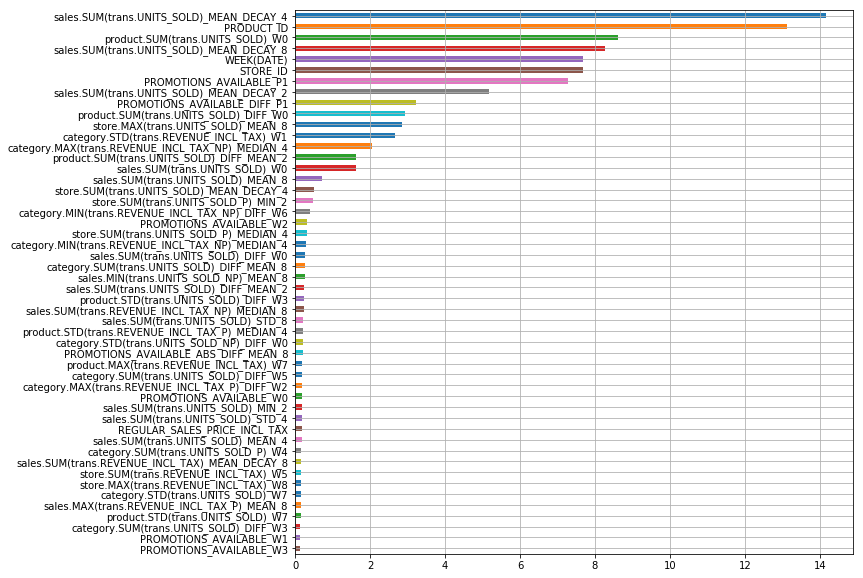

In [52]:
score.head(50).Score.plot.barh(grid=True, figsize=(10,10)).invert_yaxis()

In [50]:
fltr = pd.read_parquet('/main/data/MVideo_2/crosstrain.parquet')

In [51]:
fltr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 752281 entries, 2258 to 10833687
Data columns (total 3 columns):
STORE_ID      752281 non-null category
PRODUCT_ID    752281 non-null category
DATE          752281 non-null datetime64[ns]
dtypes: category(2), datetime64[ns](1)
memory usage: 14.4 MB


In [52]:
data_test2 = pd.merge(data_test, fltr, how = 'inner')

In [53]:
data_test2.shape

(164623, 115)

In [54]:
data_test2[['PRODUCT_ID', 'MAINCATEGORY_ID', 'SUBCATEGORY_ID',
       'STORE_ID', 'REGION', 'INTERNET',
       'WEEK(DATE)', 'MONTH(DATE)']] = data_test2[['PRODUCT_ID', 'MAINCATEGORY_ID', 'SUBCATEGORY_ID',
                                                          'STORE_ID', 'REGION', 'INTERNET',
                                                          'WEEK(DATE)', 'MONTH(DATE)']].astype('category')

In [55]:
pred3 = bst2.predict(data_test2[feat])

In [56]:
np.sqrt(mean_squared_error(data_test2.UNITS_SOLD_P1, pred3))

0.7303657771469695

In [57]:
mean_absolute_error(data_test2.UNITS_SOLD_P1, pred3)

0.4471062588695501

In [58]:
res3 = data_test2[['DATE', 'PRODUCT_ID', 'STORE_ID', 'UNITS_SOLD_P1']].copy()

In [59]:
res3['PRED_P1'] = pred3

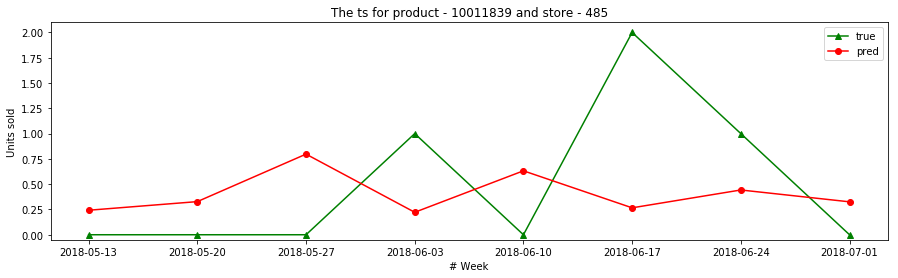

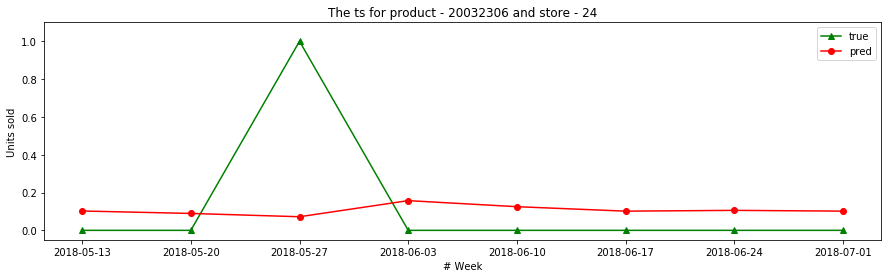

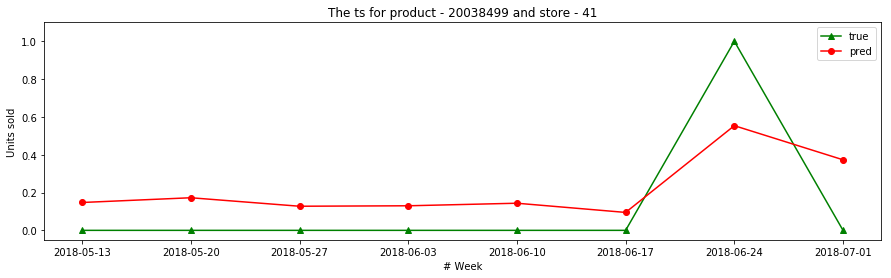

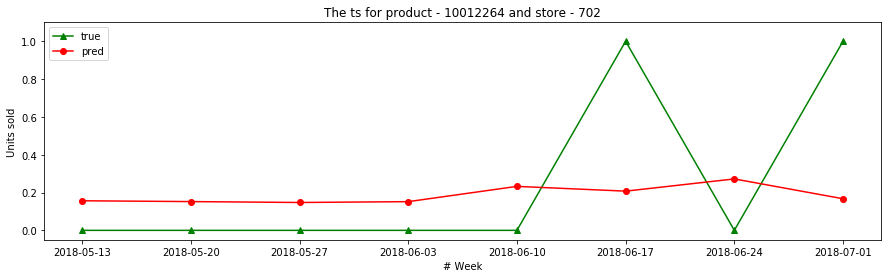

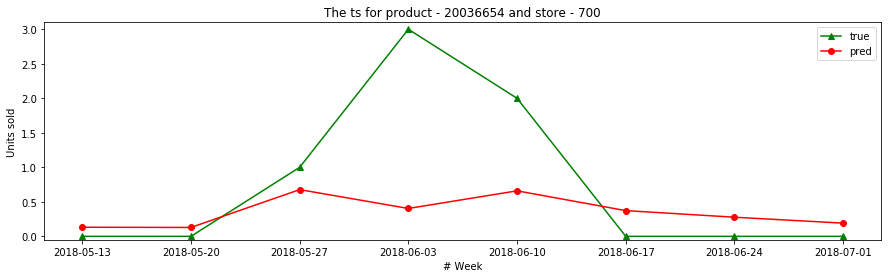

...

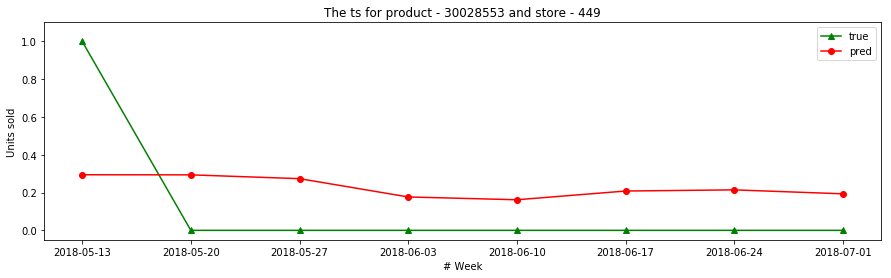

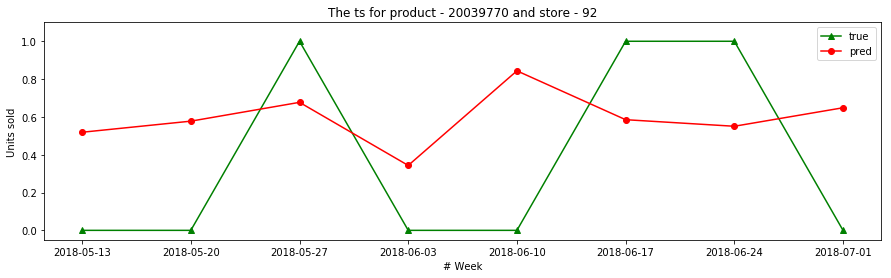

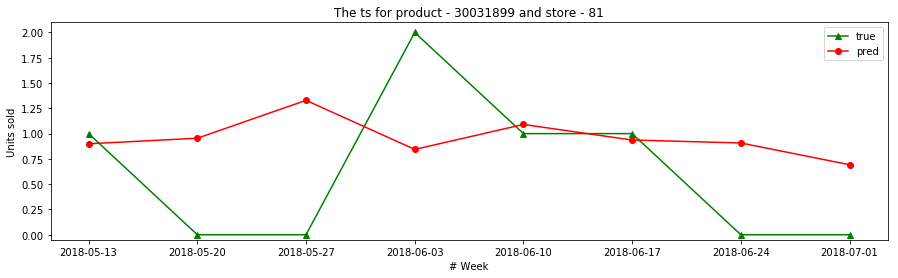

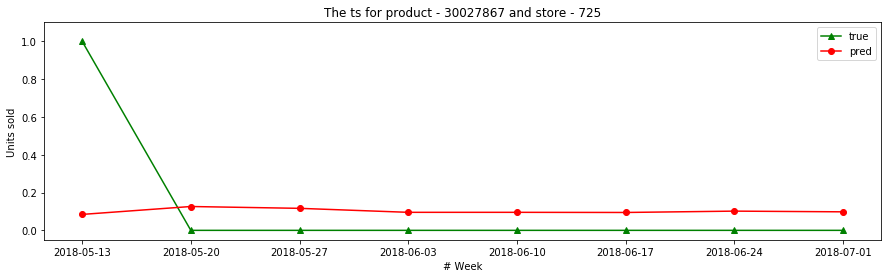

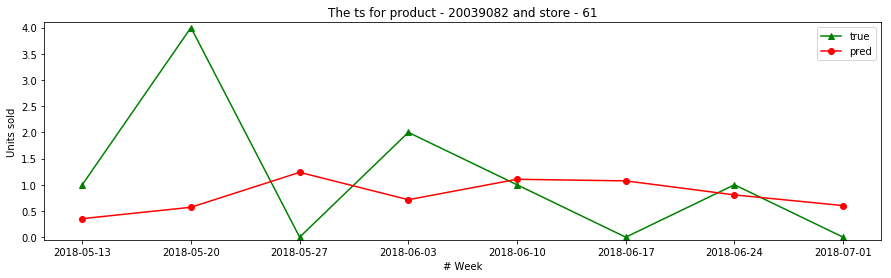

In [62]:
pairs = list(set(zip(res3['STORE_ID'], res3['PRODUCT_ID'])))

for i in range(len(pairs) // 100):
    store_id, product_id = pairs[i]
    plot_ts(res3, store_id, product_id)

In [63]:
res3.to_parquet('/main/data/MVideo_2/dataset_res_5_baseline.parquet')

In [63]:
res4 = pd.read_parquet('/main/data/MVideo_2/dataset_res_5_bad_baseline.parquet')

In [64]:
res4.rename(columns = {'PRED_P1': 'PRED_P1_OLD'}, inplace = True)

In [65]:
res4['PRED_P1'] = pred3

In [66]:
def plot_ts2(df, store_id, product_id):
    data_part = df[(df['STORE_ID'] == store_id) & (df['PRODUCT_ID'] == product_id)]
    week_range = data_part.DATE.drop_duplicates().sort_values().values
    #week_range = np.arange(data_part['DATE'].min(), data_part['DATE'].max())# + 1)
    ts = pd.DataFrame()
    ts['DATE'] = week_range
    df = pd.merge(ts, data_part, on = 'DATE', how = 'left')[['DATE', 'UNITS_SOLD_P1', 'PRED_P1_OLD', 'PRED_P1']].fillna(0)
    plt.figure(figsize=(15, 4))
    plt.plot(df['DATE'].values, df['UNITS_SOLD_P1'].values, 'g^-', label='true')
    plt.plot(df['DATE'].values, df['PRED_P1_OLD'].values, 'yo-', label='old_pred')
    plt.plot(df['DATE'].values, df['PRED_P1'].values, 'ro-', label='new_pred')
    plt.xlabel('# Week')
    plt.ylabel('Units sold')
    max_y = max(1, df['UNITS_SOLD_P1'].max(), df['PRED_P1_OLD'].max(), df['PRED_P1'].max())
    plt.ylim((-0.05, max_y + 0.1))
    plt.title('The ts for product - %s and store - %s' % (product_id, store_id))
    plt.legend(loc='best')
    plt.show()

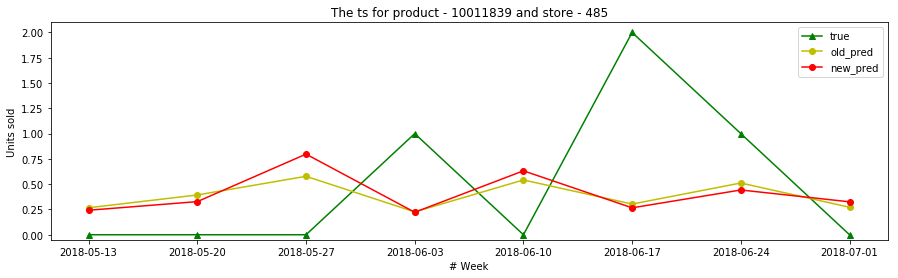

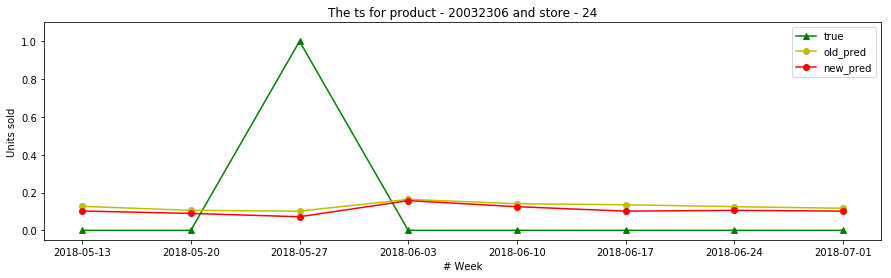

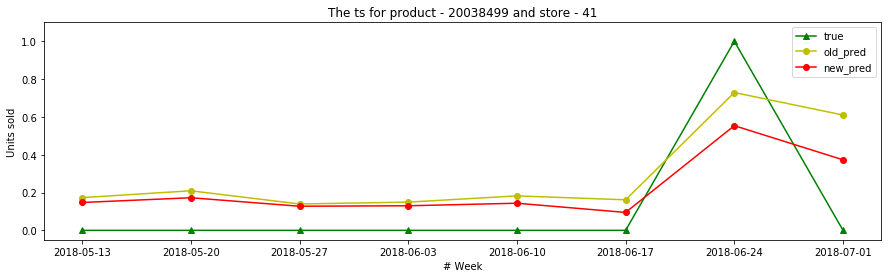

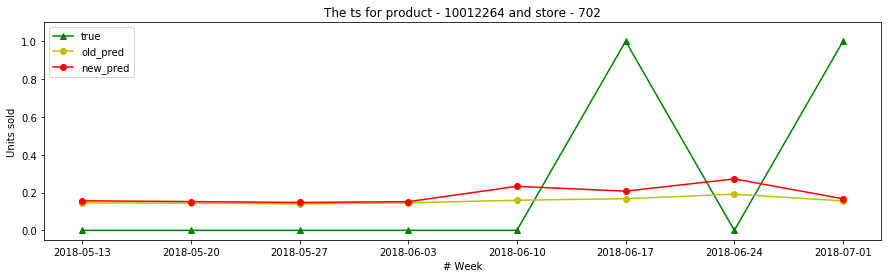

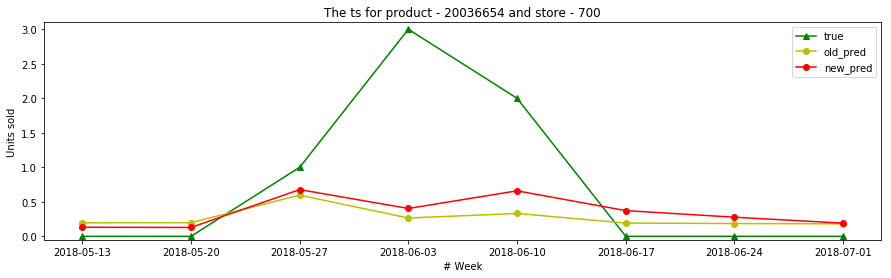

...

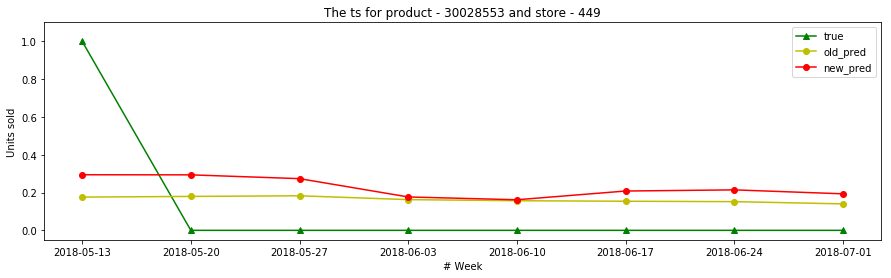

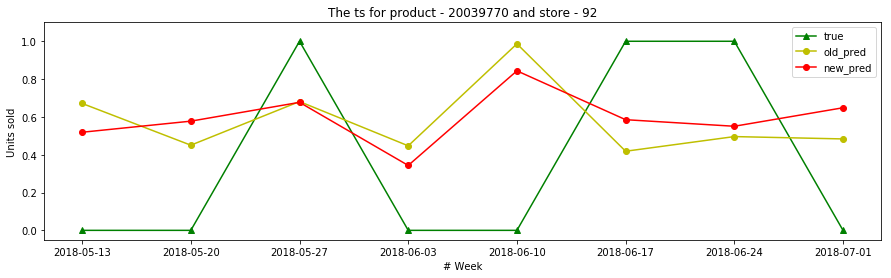

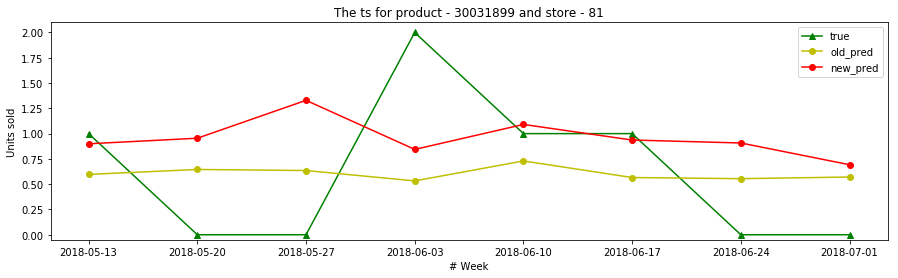

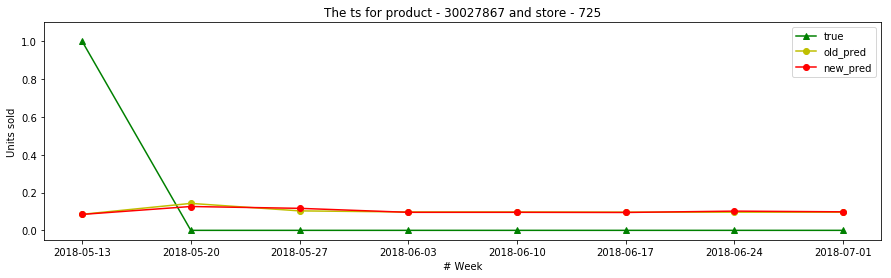

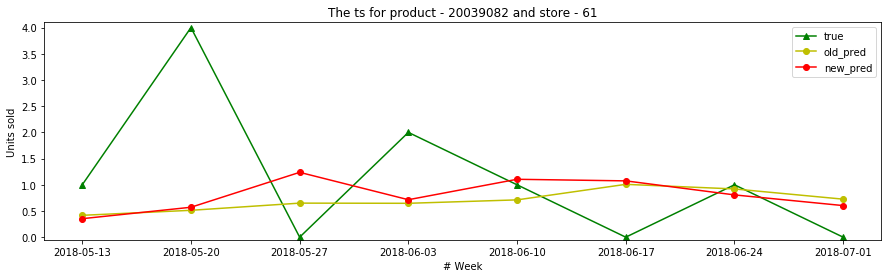

In [67]:
pairs = list(set(zip(res4['STORE_ID'], res4['PRODUCT_ID'])))

for i in range(len(pairs) // 100):
    store_id, product_id = pairs[i]
    plot_ts2(res4, store_id, product_id)